In [1]:
# Start writing code here...

In [2]:
track_data = _deepnote_execute_sql('SELECT *\nFROM \'tracks.csv\'', 'SQL_DEEPNOTE_DATAFRAME_SQL')
track_data

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,5rgu12WBIHQtvej2MdHSH0,云与海,50,258267,0,['阿YueYue'],['1QLBXKM5GCpyQQSVMNZqrZ'],2020-09-26,0.560,0.5180,0,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4
586668,0NuWgxEp51CutD2pJoF4OM,blind,72,153293,0,['ROLE MODEL'],['1dy5WNgIKQU6ezkpZs4y8z'],2020-10-21,0.765,0.6630,0,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4
586669,27Y1N4Q4U3EfDU5Ubw8ws2,What They'll Say About Us,70,187601,0,['FINNEAS'],['37M5pPGs6V1fchFJSgCguX'],2020-09-02,0.535,0.3140,7,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4
586670,45XJsGpFTyzbzeWK8VzR8S,A Day At A Time,58,142003,0,"['Gentle Bones', 'Clara Benin']","['4jGPdu95icCKVF31CcFKbS', '5ebPSE9YI5aLeZ1Z2g...",2021-03-05,0.696,0.6150,10,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4


In [83]:
# Importing necessary Libaries
import numpy as np
import pandas as pd
import seaborn as sb
import time
import plotly.express as px   #importing plotly
from scipy.stats import pearsonr 
from scipy import stats
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "png"
import os 
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import tree, preprocessing, linear_model, metrics
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import classification_report, confusion_matrix, r2_score, mean_squared_error, mean_absolute_error, accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
sb.set()

# Part I: Data preparation & cleaning

In [4]:
# Import the Dataset - tracks.csv

track_data = pd.read_csv('tracks.csv')
track_data.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [5]:
track_data.shape

(586672, 20)

In [6]:
#From the dataset, we observed that quite a few songs have a popularity score of 0. To make sure there are
#not too many songs with a popularity score of 0, we find the number of '0' values in the 'popularity' column

(track_data['popularity']==0).sum()

#44690 out of over 500,000 values are '0's. This means about 8% of the songs have a popularity score of 0.

44690

In [7]:
# Give us the size of the spreadsheet we're working with

track_data.size

11733440

In [8]:
# Find the number of missing values in the datatset

pd.isnull(track_data).sum()

# There are 71 missing values in the dataset and all 71 of these mssing values are in the name column. Since 
#the names of the songs are not an important predictor for the popularity of the song, we will leave them as
#null.

id                   0
name                71
popularity           0
duration_ms          0
explicit             0
artists              0
id_artists           0
release_date         0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
dtype: int64

In [9]:
# An overview of the data we are working with
track_data.describe

<bound method NDFrame.describe of                             id                                 name  \
0       35iwgR4jXetI318WEWsa1Q                                Carve   
1       021ht4sdgPcrDgSk7JTbKY  Capítulo 2.16 - Banquero Anarquista   
2       07A5yehtSnoedViJAZkNnc   Vivo para Quererte - Remasterizado   
3       08FmqUhxtyLTn6pAh6bk45        El Prisionero - Remasterizado   
4       08y9GfoqCWfOGsKdwojr5e                  Lady of the Evening   
...                        ...                                  ...   
586667  5rgu12WBIHQtvej2MdHSH0                                  云与海   
586668  0NuWgxEp51CutD2pJoF4OM                                blind   
586669  27Y1N4Q4U3EfDU5Ubw8ws2            What They'll Say About Us   
586670  45XJsGpFTyzbzeWK8VzR8S                      A Day At A Time   
586671  5Ocn6dZ3BJFPWh4ylwFXtn                     Mar de Emociones   

        popularity  duration_ms  explicit                          artists  \
0                6       126903    

In [10]:
# Finding the data types present in our data set
print(track_data.dtypes)

id                   object
name                 object
popularity            int64
duration_ms           int64
explicit              int64
artists              object
id_artists           object
release_date         object
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature        int64
dtype: object


In [11]:
#To make the column 'release_data' easier to work with, we change 'release_date' to a date type and then put months and years into separate columns

track_data['release_date'] =  pd.to_datetime(track_data['release_date'], format='%Y-%m-%d')
year = track_data['release_date'].apply(lambda x : x.year)
month = track_data['release_date'].apply(lambda x : x.month)
track_data.insert(loc=8, column='year', value=year) 
track_data.insert(loc=9, column='month', value=month)

In [12]:
# Using the query function to find the 10 most popular songs right now

most_popular = track_data.query('popularity>90', inplace=False).sort_values('popularity', ascending=False)
most_popular[:10]


,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,year,month,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
93802,4iJyoBOLtHqaGxP12qzhQI,Peaches (feat. Daniel Caesar & Giveon),100,198082,1,"['Justin Bieber', 'Daniel Caesar', 'Giveon']","['1uNFoZAHBGtllmzznpCI3s', '20wkVLutqVOYrc0kxF...",2021-03-19,2021,3,...,0,-6.181,1,0.1190,0.32100,0.000000,0.4200,0.464,90.030,4
93803,7lPN2DXiMsVn7XUKtOW1CS,drivers license,99,242014,1,['Olivia Rodrigo'],['1McMsnEElThX1knmY4oliG'],2021-01-08,2021,1,...,10,-8.761,1,0.0601,0.72100,0.000013,0.1050,0.132,143.874,4
93804,3Ofmpyhv5UAQ70mENzB277,Astronaut In The Ocean,98,132780,0,['Masked Wolf'],['1uU7g3DNSbsu0QjSEqZtEd'],2021-01-06,2021,1,...,4,-6.865,0,0.0913,0.17500,0.000000,0.1500,0.472,149.996,4
92810,5QO79kh1waicV47BqGRL3g,Save Your Tears,97,215627,1,['The Weeknd'],['1Xyo4u8uXC1ZmMpatF05PJ'],2020-03-20,2020,3,...,0,-5.487,1,0.0309,0.02120,0.000012,0.5430,0.644,118.051,4
92811,6tDDoYIxWvMLTdKpjFkc1B,telepatía,97,160191,0,['Kali Uchis'],['1U1el3k54VvEUzo3ybLPlM'],2020-12-04,2020,12,...,11,-9.016,0,0.0502,0.11200,0.000000,0.2030,0.553,83.970,4
92813,0VjIjW4GlUZAMYd2vXMi3b,Blinding Lights,96,200040,0,['The Weeknd'],['1Xyo4u8uXC1ZmMpatF05PJ'],2020-03-20,2020,3,...,1,-5.934,1,0.0598,0.00146,0.000095,0.0897,0.334,171.005,4
93805,7MAibcTli4IisCtbHKrGMh,Leave The Door Open,96,242096,0,"['Bruno Mars', 'Anderson .Paak', 'Silk Sonic']","['0du5cEVh5yTK9QJze8zA0C', '3jK9MiCrA42lLAdMGU...",2021-03-05,2021,3,...,5,-7.964,1,0.0324,0.18200,0.000000,0.0927,0.719,148.088,4
92814,6f3Slt0GbA2bPZlz0aIFXN,The Business,95,164000,0,['Tiësto'],['2o5jDhtHVPhrJdv3cEQ99Z'],2020-09-16,2020,9,...,8,-7.079,0,0.2320,0.41400,0.019200,0.1120,0.235,120.031,4
91866,60ynsPSSKe6O3sfwRnIBRf,Streets,94,226987,1,['Doja Cat'],['5cj0lLjcoR7YOSnhnX0Po5'],2019-11-07,2019,11,...,11,-8.433,1,0.0828,0.20800,0.037100,0.3370,0.190,90.028,4
92816,3FAJ6O0NOHQV8Mc5Ri6ENp,Heartbreak Anniversary,94,198371,0,['Giveon'],['4fxd5Ee7UefO4CUXgwJ7IP'],2020-03-27,2020,3,...,0,-8.964,1,0.0791,0.52400,0.000001,0.3030,0.543,89.087,3


##### At first glance, we can see that the first 10 most popular songs were released either in 2020 or 2021 and that almost half of them contain some explicit content indicated by the binary 1 in the explicit column. To confirm our observation, we will sort the filtered values and show the columns of interest.

In [13]:
pop_date = most_popular.sort_values('release_date', ascending=False)
pop_date[['name', 'popularity', 'explicit','release_date']][:20]

,name,popularity,explicit,release_date
93802,Peaches (feat. Daniel Caesar & Giveon),100,1,2021-03-19
93805,Leave The Door Open,96,0,2021-03-05
93815,What’s Next,91,1,2021-03-05
93811,Hold On,92,0,2021-03-05
93816,We're Good,91,0,2021-02-11
93813,911,91,1,2021-02-05
93809,Up,92,1,2021-02-05
93806,Fiel,94,0,2021-02-04
93808,Ella No Es Tuya - Remix,92,0,2021-02-03
93812,Wellerman - Sea Shanty / 220 KID x Billen Ted ...,92,0,2021-01-21


In [14]:
# From our background research on what makes songs popular, we found that danceability appeals to a large audience. So we check that

dance = track_data.groupby('popularity')['danceability'].mean().sort_values(ascending=[False]).reset_index()
dance.head()

,popularity,danceability
0,95,0.798000
1,98,0.778000
2,91,0.751091
3,88,0.727105
4,85,0.712600


##### We decided to use a scatter plot to visualise the correlation between the factors as the drawing of the best-fit line not only gives a clear visualisation of the correlation but the numeric correlation can also be found from the gradient of the line. 

# Part II: EDA / Visualization

##### Now, we move on to finding the correlation bewtween all the variables and popularity but instead of plotting a scatter plot seperately for each one of them, we will rely on corr() and heatmap and use them together to achieve the correlation for all the other variables as well. 

<AxesSubplot: xlabel='popularity', ylabel='duration_ms'>

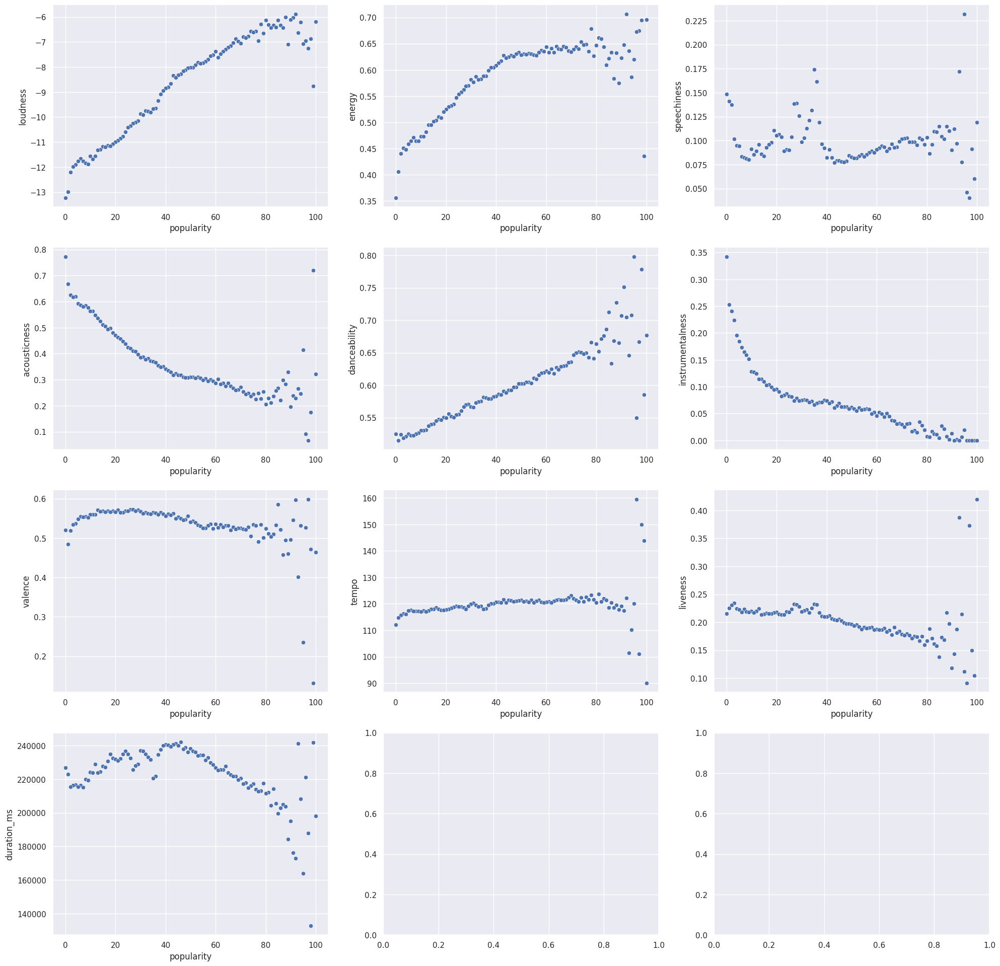

In [15]:
energy = track_data.groupby('popularity')['energy'].mean().sort_values(ascending=[False]).reset_index()
loudness = track_data.groupby('popularity')['loudness'].mean().sort_values(ascending=[False]).reset_index()
speechiness = track_data.groupby('popularity')['speechiness'].mean().sort_values(ascending=[False]).reset_index()
acousticness = track_data.groupby('popularity')['acousticness'].mean().sort_values(ascending=[False]).reset_index()
valence = track_data.groupby('popularity')['valence'].mean().sort_values(ascending=[False]).reset_index()
tempo = track_data.groupby('popularity')['tempo'].mean().sort_values(ascending=[False]).reset_index()
liveliness = track_data.groupby('popularity')['liveness'].mean().sort_values(ascending=[False]).reset_index()
duration = track_data.groupby('popularity')['duration_ms'].mean().sort_values(ascending=[False]).reset_index()
instrumtl = track_data.groupby('popularity')['instrumentalness'].mean().sort_values(ascending=[False]).reset_index()

k, axes = plt.subplots(4, 3, figsize=(24,24))
sb.scatterplot(data=loudness, x='popularity', y='loudness', ax = axes[0,0])
sb.scatterplot(data=energy, x='popularity', y='energy', ax = axes[0,1])
sb.scatterplot(data=speechiness, x='popularity', y='speechiness', ax = axes[0,2])
sb.scatterplot(data=acousticness, x='popularity', y='acousticness', ax = axes[1,0])
sb.scatterplot(data=dance, x='popularity', y='danceability', ax = axes[1,1])
sb.scatterplot(data=instrumtl, x='popularity', y='instrumentalness', ax = axes[1,2])
sb.scatterplot(data=valence, x='popularity', y='valence', ax = axes[2,0])
sb.scatterplot(data=tempo, x='popularity', y='tempo', ax = axes[2,1])
sb.scatterplot(data=liveliness, x='popularity', y='liveness', ax = axes[2,2])
sb.scatterplot(data=duration, x='popularity', y='duration_ms', ax = axes[3,0])

#### Our dataset contains podcasts in addition to songs as spotify also features popularity of podcasts. However we are only focused on predicting the popularity of the songs, not podcasts. Thus we need further cleaning on the duration variable.
#### To make the duration easier to work with, we change the unit of duration from milliseconds to minutes by dividing by 60000 and formatting it to 3sf for easier readibility.

In [16]:
track_data['duration']= round(track_data['duration_ms']/60000,2)
track_data.drop(['duration_ms'], axis = 1)

,id,name,popularity,explicit,artists,id_artists,release_date,year,month,danceability,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
0,35iwgR4jXetI318WEWsa1Q,Carve,6,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,1922,2,0.645,...,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3,2.12
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,1922,6,0.695,...,-22.136,1,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1,1.64
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,1922,3,0.434,...,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5,3.03
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,1922,3,0.321,...,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3,2.95
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922-01-01,1922,1,0.402,...,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4,2.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,5rgu12WBIHQtvej2MdHSH0,云与海,50,0,['阿YueYue'],['1QLBXKM5GCpyQQSVMNZqrZ'],2020-09-26,2020,9,0.560,...,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4,4.30
586668,0NuWgxEp51CutD2pJoF4OM,blind,72,0,['ROLE MODEL'],['1dy5WNgIKQU6ezkpZs4y8z'],2020-10-21,2020,10,0.765,...,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4,2.55
586669,27Y1N4Q4U3EfDU5Ubw8ws2,What They'll Say About Us,70,0,['FINNEAS'],['37M5pPGs6V1fchFJSgCguX'],2020-09-02,2020,9,0.535,...,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4,3.13
586670,45XJsGpFTyzbzeWK8VzR8S,A Day At A Time,58,0,"['Gentle Bones', 'Clara Benin']","['4jGPdu95icCKVF31CcFKbS', '5ebPSE9YI5aLeZ1Z2g...",2021-03-05,2021,3,0.696,...,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4,2.37


In [17]:
track_data[track_data['duration'] <= 5]

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,year,month,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,1922,2,...,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3,2.12
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,1922,6,...,-22.136,1,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1,1.64
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,1922,3,...,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5,3.03
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,1922,3,...,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3,2.95
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922-01-01,1922,1,...,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4,2.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,5rgu12WBIHQtvej2MdHSH0,云与海,50,258267,0,['阿YueYue'],['1QLBXKM5GCpyQQSVMNZqrZ'],2020-09-26,2020,9,...,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4,4.30
586668,0NuWgxEp51CutD2pJoF4OM,blind,72,153293,0,['ROLE MODEL'],['1dy5WNgIKQU6ezkpZs4y8z'],2020-10-21,2020,10,...,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4,2.55
586669,27Y1N4Q4U3EfDU5Ubw8ws2,What They'll Say About Us,70,187601,0,['FINNEAS'],['37M5pPGs6V1fchFJSgCguX'],2020-09-02,2020,9,...,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4,3.13
586670,45XJsGpFTyzbzeWK8VzR8S,A Day At A Time,58,142003,0,"['Gentle Bones', 'Clara Benin']","['4jGPdu95icCKVF31CcFKbS', '5ebPSE9YI5aLeZ1Z2g...",2021-03-05,2021,3,...,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4,2.37


##### This drops potential podcasts from being included in the dataset, only including if a song is 5 minutes or less. Our new plot is shown below.

In [18]:
fig3 = px.scatter(track_data[track_data['duration'] <= 5], x="popularity", y="duration", color="duration",size='popularity')
fig3.show()

In [86]:
fig3.show(renderer="notebook_connected")

##### Evident from the graph above, there is still no determinable correlation (or correlation = 0) between the song's duration and its popularity.

In [19]:
import plotly.graph_objects as go    #importing the library Graph objects to use both corr() and heatmap

matrix=track_data.corr()  #returns a matrix with correlation of all features
x_list=['popularity','duration','explicit',
        'danceability','energy','key','loudness',
        'mode','speechiness','acousticness','instrumentalness',
        'liveness','valence','tempo','time_signature']

fig_heatmap = go.Figure(data=go.Heatmap(
                   z=matrix,
                   x=x_list,
                   y=x_list,
                   hoverongaps = False))
fig_heatmap.update_layout(margin = dict(t=200,r=200,b=200,l=200),
    width = 800, height = 650,
    autosize = False )

fig_heatmap.show()

In [87]:
fig_heatmap.show(renderer="notebook_connected")

##### By observing the above heatmap and the scatterplots, we have chosen danceablility, loudness, speechiness, liveliness and valence as the variables we want to use as predictor variables for the response variable of popularity. This is because these variables have either the highest positive correlation or the lowest negative correlation to popularity.

##### Next, we will drop all other variables which we will not use to predict popularity

In [20]:
#track_data = track_data.drop(['time_signature','tempo','instrumentalness','acousticness','mode','key','energy','explicit','duration_ms','month','year','artists','id','name','id_artists','release_date','duration'],axis=1)
#track_data
track_data = track_data.drop(['explicit','duration_ms','month','year','artists','id','name','id_artists','release_date'],axis=1)
track_data

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
0,6,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3,2.12
1,0,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1,1.64
2,0,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5,3.03
3,0,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3,2.95
4,0,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4,2.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,50,0.560,0.5180,0,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4,4.30
586668,72,0.765,0.6630,0,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4,2.55
586669,70,0.535,0.3140,7,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4,3.13
586670,58,0.696,0.6150,10,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4,2.37


##### We will now proceed to remove the outliers from the dataset to improve the accuracy of the results when we implement machine learning techniques.

## Removing Outliers

### Identifying Outliers

First, we will identify the outliers using a boxplot 

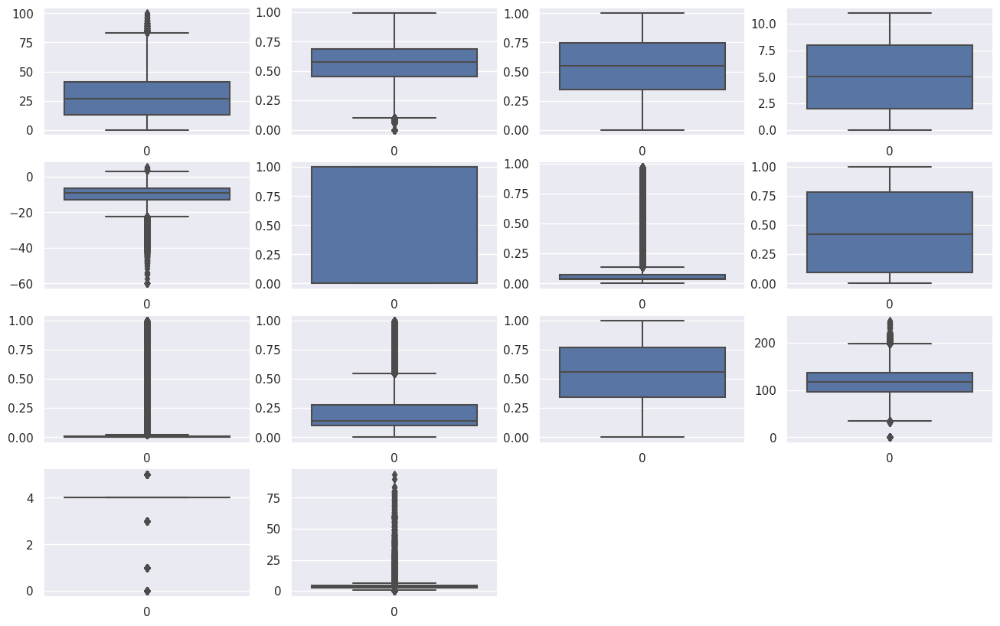

In [21]:
# We will use a boxplot to spot outliers
plt.figure(figsize=(16,10))

for i in  range(len(track_data.columns)):
    plt.subplot(4,4,i+1)
    sb.boxplot(track_data[track_data.columns[i]])

plt.show()

Let's first create a function to get the outlier count for each variable

In [22]:
def get_outlier_counts(df, threshold):
    df=df.copy()

    #Get the z-score for specified threshold
    threshold_z_score = stats.norm.ppf(threshold)

    #Get the z-scores for each value in df, and 
    z_score_df =pd.DataFrame(np.abs(stats.zscore(df)),columns=df.columns)

    #Compare df z_scores to the threshold and return the count of outliers in each column 
    return (z_score_df > threshold_z_score).sum(axis=0)

In [23]:
get_outlier_counts(track_data,0.99999999)

popularity             0
danceability           0
energy                 0
key                    0
loudness             249
mode                   0
speechiness            0
acousticness           0
instrumentalness       0
liveness               0
valence                0
tempo                  0
time_signature      6941
duration            1871
dtype: int64

Now, let us create a function to remove these outliers row-wise from the dataframe

In [24]:
def remove_outliers(df,threshold):
    df=df.copy()

    #Get the z-score for specified threshold
    threshold_z_score= stats.norm.ppf(threshold)

    #Get the z-scores for each value in df 
    z_score_df= pd.DataFrame(np.abs(stats.zscore(df)),columns=df.columns)
    z_score_df= z_score_df > threshold_z_score

    #Get indices of the outliers 
    outliers = z_score_df.sum(axis=1)
    outliers= outliers >0
    outlier_indices = df.index[outliers]
    df=df.drop(outlier_indices,axis=0).reset_index(drop=True)

    return df

In [25]:
remove_outliers(track_data, 0.999999)

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
0,6,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3,2.12
1,0,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5,3.03
2,0,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3,2.95
3,0,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4,2.72
4,0,0.227,0.2610,5,-12.343,1,0.0382,0.994,0.247000,0.0977,0.0539,118.891,4,2.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575094,50,0.560,0.5180,0,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4,4.30
575095,72,0.765,0.6630,0,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4,2.55
575096,70,0.535,0.3140,7,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4,3.13
575097,58,0.696,0.6150,10,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4,2.37


### PreProcessing

In [26]:
def preprocess_inputs(df, outliers= True, threshold=0.999999):
    df=df.copy()

    #Remove outliers if specified 
    if outliers ==False: 
        df= remove_outliers(df,threshold)

    #Split df into X and y 
    y= df['popularity'].copy()
    X=df.drop('popularity',axis=1).copy()

    #Train-test split 
    X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7, random_state=1)

    #Scale X with a standard scaler 
    scaler = StandardScaler()
    scaler.fit(X_train)

    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)

    return X_train, X_test, y_train, y_test

In [27]:
outlier_X_train, outlier_X_test, outlier_y_train, outlier_y_test= preprocess_inputs(track_data, outliers=True)
X_train, X_test, y_train, y_test= preprocess_inputs(track_data, outliers=False, threshold=0.999999)

### Accuracy Testing

Next, let us use linear regression to compare the accuracy of the model created by the dataframe with and without outliers. We will also be using this to compare the accuracy of both cleaned and uncleaned dataframe to determine a threshold when removing outliers.

In [28]:
# With outliers 

outlier_model= LinearRegression()
outlier_model.fit(outlier_X_train,outlier_y_train)

outlier_model_acc = outlier_model.score(outlier_X_test, outlier_y_test)

print("Test Accuracy (Outliers): {:.5f}%".format(outlier_model_acc*100))


Test Accuracy (Outliers): 21.29765%


In [29]:
# Without Outliers

model = LinearRegression()
model.fit(X_train,y_train)

model_acc= model.score(X_test, y_test)
print("Test Accuracy (No Outliers): {:.5f}%".format(model_acc*100))

Test Accuracy (No Outliers): 21.41042%


In [30]:
# Let us create a new dataframe without the outliers
cleaned_data = remove_outliers(track_data, 0.999999)

# Part III: Machine Learning Techniques

### Model 1: Multiple Linear Regression

 Response variable: Popularity 
 Predictor variables: Danceability, Loudness, Speechiness, Liveliness, Valence 
 Regression Model: Popularity =  b0 + b1 * Danceability + b2 * Loudness + b3 * Speechiness + b4 * Liveliness + b5 * Valence + error
 In the regression model, the coefficients b1-b5 tell us the slope of the regression line which tells whether the line is increasing or decreasing. b0 is the value of Popularity when the value of all the predictor variables are 0.

##### Multiple Linear Regression (MLR) Model with outliers:

In [56]:
# Setting the values for independent (X) variable and dependent (Y) variable
X = track_data[['danceability', 'loudness', 'speechiness', 'liveness', 'valence']]
y = track_data['popularity']

# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

# Fitting the Multiple Linear Regression model
mlr = LinearRegression()  
mlr.fit(X_train, y_train)

# Intercept and Coefficient
print("Intercept: ", mlr.intercept_)
print("Coefficients:")
list(zip(X, mlr.coef_))

Intercept:  35.2644775191842
Coefficients:


[('danceability', 22.791126257644493),
 ('loudness', 1.1806952297769997),
 ('speechiness', -1.749644789400932),
 ('liveness', -3.2903939581372144),
 ('valence', -13.77799578851786)]

##### The coefficients tell us how strongly related each variable is to popularity

In [57]:
# Prediction of test set
y_pred_mlr= mlr.predict(X_test)

#Predicted values
print("Prediction for test set: {}".format(y_pred_mlr))

Prediction for test set: [25.73849837 23.23084215 16.32923199 ... 38.0514145  25.9363669
 24.75060499]


In [58]:
#Actual value and the predicted value
mlr_diff = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred_mlr})
mlr_diff.head()

,Actual value,Predicted value
95137,5,25.738498
376737,17,23.230842
24711,12,16.329232
185427,45,35.873081
440027,20,15.433260


In [59]:
# Model Evaluation
meanAbErr = metrics.mean_absolute_error(y_test, y_pred_mlr)
meanSqErr = metrics.mean_squared_error(y_test, y_pred_mlr)
rootMeanSqErr = np.sqrt(metrics.mean_squared_error(y_test, y_pred_mlr))
rez1 = stats.linregress(y_test, y_pred_mlr)
print('Based on original data (with outliers):')
print(f"R-squared: {rez1.rvalue**2:.6f}")
print('Mean Absolute Error:', meanAbErr)
print('Mean Square Error:', meanSqErr)
print('Root Mean Square Error:', rootMeanSqErr)

Based on original data (with outliers):
R-squared: 0.148548
Mean Absolute Error: 13.86689425644089
Mean Square Error: 287.72023412389603
Root Mean Square Error: 16.962318064577612


##### Multiple Linear Regression (MLR) Model without outliers:

In [60]:
# Setting the values for independent (X) variable and dependent (Y) variable
X = cleaned_data[['danceability', 'loudness', 'speechiness', 'liveness', 'valence']]
y = cleaned_data['popularity']

# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

# Fitting the Multiple Linear Regression model
mlr = LinearRegression()  
mlr.fit(X_train, y_train)

# Intercept and Coefficient
print("Intercept: ", mlr.intercept_)
print("Coefficients:")
list(zip(X, mlr.coef_))

Intercept:  35.629575365535274
Coefficients:


[('danceability', 23.30428746422129),
 ('loudness', 1.235323494427869),
 ('speechiness', -0.7699326674778154),
 ('liveness', -3.6116160606971737),
 ('valence', -13.996795241790664)]

In [61]:
# Prediction of test set
y_pred_mlr2= mlr.predict(X_test)

#Predicted values
print("Prediction for test set: {}".format(y_pred_mlr2))

Prediction for test set: [28.68697906 31.01267794 23.93708617 ... 32.56168157 25.11306354
 31.95435189]


In [62]:
# Actual value and the predicted value
mlr_diff = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred_mlr2})
mlr_diff.head()

,Actual value,Predicted value
261946,27,28.686979
223509,16,31.012678
236447,34,23.937086
321831,30,17.206419
185579,18,23.458121


In [63]:
# Model Evaluation
meanAbErr2 = metrics.mean_absolute_error(y_test, y_pred_mlr2)
meanSqErr2 = metrics.mean_squared_error(y_test, y_pred_mlr2)
rootMeanSqErr2 = np.sqrt(metrics.mean_squared_error(y_test, y_pred_mlr2))
rez2 = stats.linregress(y_test, y_pred_mlr2)
print('Based on cleaned data (without outliers):')
print(f"R-squared: {rez2.rvalue**2:.6f}")
print('Mean Absolute Error:', meanAbErr2)
print('Mean Square Error:', meanSqErr2)
print('Root Mean Square Error:', rootMeanSqErr2)

Based on cleaned data (without outliers):
R-squared: 0.150245
Mean Absolute Error: 13.826777132621485
Mean Square Error: 286.8200310865487
Root Mean Square Error: 16.93576189861409


##### When the cleaned data was used, the MLR model produced an R-squared value of 0.150245. This was slighlty higher than the R-squared value of 0.148548 produced by the MLR model when the uncleaned data was used. This suggests that the removal of outliers from the dataset does indeed help to improve the accuracy of the model, although only slightly.

### Model 2: Random Forest
#####  Response variable: Popularity 
##### Predictor variables: Duration, Danceability, Energy, Key, Loudness, Mode, Speechiness, Acousticness, Instrumentalness, Liveness, Valence, Tempo, Time_signature

##### Random Forest Model with outliers:

In [39]:
# Setting the values for independent (X) variable and dependent (Y) variable
X = track_data[['duration','danceability','energy','key','loudness','mode','speechiness','acousticness','instrumentalness','liveness','valence','tempo','time_signature']]
y = track_data['popularity']

# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Setting up our model
rfc = RandomForestRegressor(n_estimators=500, max_depth = 9, random_state=101)

# Fit RandomForestClassifier
rfc.fit(X_train, y_train)
# Predict the test set labels
y_pred = rfc.predict(X_test)

res = stats.linregress(y_test, y_pred)
print('Based on original data (with outliers):')
print(f"R-squared: {res.rvalue**2:.6f}")
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Based on original data (with outliers):
R-squared: 0.320521
Mean Absolute Error: 12.05301900344451
Mean Squared Error: 230.01029048736945
Root Mean Squared Error: 15.166090151630032


##### While building our model, n_estimators is something new that we countered in random forests, we found out that it used to generate a certain number of trees. Based on our research, more trees have a higher accuracy, but there will be diminishing returns in the long run. Hence we went with 500 as a good start, with a high depth of 9. Next we'll be using the cleaned data to see if the accuracy changes, and to determine which is the better (or best) model.

##### Random Forest Model without outliers:

In [40]:
# Same thing but we'll be using the cleaned data
X_new = cleaned_data[['duration','danceability','energy','key','loudness','mode','speechiness','acousticness','instrumentalness','liveness','valence','tempo','time_signature']]
y_new = cleaned_data['popularity']

# Splitting the data into train and test sets
X_new_train, X_new_test, y_new_train, y_new_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Setting up our model
rfc_new = RandomForestRegressor(n_estimators=500, max_depth = 9, random_state=101)

# Fit RandomForestClassifier
rfc_new.fit(X_new_train, y_new_train)
# Predict the test set labels
y_new_pred = rfc_new.predict(X_new_test)

res_new = stats.linregress(y_new_test, y_new_pred)
print('Based on cleaned data (without outliers):')
print(f"R-squared: {res_new.rvalue**2:.6f}")
print('Mean Absolute Error:', mean_absolute_error(y_new_test, y_new_pred))
print('Mean Squared Error:', mean_squared_error(y_new_test, y_new_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_new_test, y_new_pred)))

Based on cleaned data (without outliers):
R-squared: 0.320521
Mean Absolute Error: 12.05301900344451
Mean Squared Error: 230.01029048736945
Root Mean Squared Error: 15.166090151630032


##### The Random Forest model does not differ when we're using the cleaned or uncleaned dataset. This is probably due to the nature of a Random Forest model being resilient to outliers. Besides, the R squared value for those already beats our Multiple Linear Regression model. We shall try to declutter the features to find the optimal combination.




##### We can also get a feature importance calculation to determine the ranking of each feature that relates to popularity on a graph by using the feature_importances_ property of the classifier.

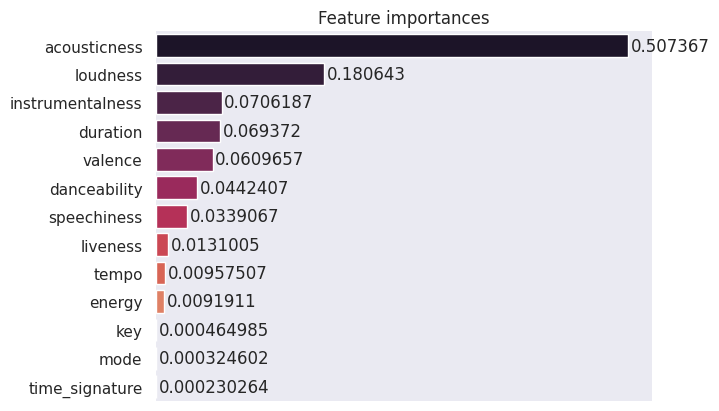

In [41]:
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })

# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)

# Barplot of the result without borders and axis lines
g = sb.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sb.despine(bottom = True, left = True)
g.set_title('Feature importances')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)

In [42]:
# Same thing but we'll be using the top variables
Impt = cleaned_data.drop(['time_signature','mode','key','energy','tempo','liveness'],axis=1)
Impt

,popularity,danceability,loudness,speechiness,acousticness,instrumentalness,valence,duration
0,6,0.645,-13.338,0.4510,0.674,0.744000,0.1270,2.12
1,0,0.434,-21.180,0.0512,0.994,0.021800,0.4570,3.03
2,0,0.321,-27.961,0.0504,0.995,0.918000,0.3970,2.95
3,0,0.402,-16.900,0.0390,0.989,0.130000,0.1960,2.72
4,0,0.227,-12.343,0.0382,0.994,0.247000,0.0539,2.98
...,...,...,...,...,...,...,...,...
575094,50,0.560,-7.471,0.0292,0.785,0.000000,0.2110,4.30
575095,72,0.765,-5.223,0.0652,0.141,0.000297,0.6860,2.55
575096,70,0.535,-12.823,0.0408,0.895,0.000150,0.0663,3.13
575097,58,0.696,-6.212,0.0345,0.206,0.000003,0.4380,2.37


In [43]:
X_Impt = Impt[['duration','danceability','loudness','speechiness','acousticness','instrumentalness','valence']]
y_Impt = Impt['popularity']

# Splitting the data into train and test sets
X_Impt_train, X_Impt_test, y_Impt_train, y_Impt_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Setting up our model
rfc_Impt = RandomForestRegressor(n_estimators=500, max_depth = 9, random_state=101)

# Fit RandomForestClassifier
rfc_Impt.fit(X_Impt_train, y_Impt_train)
# Predict the test set labels
y_Impt_pred = rfc_Impt.predict(X_Impt_test)

res_Impt = stats.linregress(y_Impt_test, y_Impt_pred)
print('Based on data with important features only:')
print(f"R-squared: {res_Impt.rvalue**2:.6f}")
print('Mean Absolute Error:', mean_absolute_error(y_Impt_test, y_Impt_pred))
print('Mean Squared Error:', mean_squared_error(y_Impt_test, y_Impt_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_Impt_test, y_Impt_pred)))

Based on data with important features only:
R-squared: 0.320521
Mean Absolute Error: 12.05301900344451
Mean Squared Error: 230.01029048736945
Root Mean Squared Error: 15.166090151630032


##### In summary for the Random Forest regression model, the feature importance data does not seem to affect the R squared value at all. We have deduced that this is because we have already generated the best tree consisting of the best possible feature combinations and their weightage in predicting the outcome of popularity. 

### Conclusion

##### After using both of our models, Multiple Linear Regression and Random Forest, we did a comparison on the results with and without outliers. Out of the two, it can be deduced that random forest regression is a better model due to its higher R squared value and lower root mean squared error. The same R squared value with and without outliers shows that our random forest model is resistant to outliers. Taking a closer look at the feature importances, acousticness is the strongest predictor by a huge margin. 

##### In a nutshell, to get the most accurate popularity score of a song, we have chosen the random forest regression model choosing acousticness, as the top predictor.

### Reflection

##### Music artists, publishers, or producers can consider this result to better craft better marketing strategies – in the musical sense. For example, they can consider the fact that acousticness is an important predictor for popularity when producing songs.They can also make use of the resistivity and accuracy of random forest to predict popularity of their songs. They can use these insights to better understand the music industry. On the other hand, Spotify also has the capability to monitor and shape people’s music listening behavior according to their algorithm. 

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=fbb651de-0180-4974-bf12-6b77f183dd37' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>